In [1]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [2]:
def calculate_gray_min_max(img):
  r_min = 100000
  r_max = -100000

  row , col = img.shape[0],img.shape[1]

  for i in range(0,row-1):
   for j in range(0,col-1):
     pixel = img[i,j]

     if(pixel<r_min):
        r_min = pixel
     if(pixel>r_max):
        r_max = pixel

  return r_min,r_max

In [3]:
def contrast_stretching_gray(img,l,m,n,a,b):
  row , col  = img.shape[0],img.shape[1]

  for i in range(0,row-1):
   for j in range(0,col-1):
    pixel = img[i,j]

    if(pixel<=a):
      pixel = l*pixel

    if(a<pixel<=b):
      pixel = m*(pixel-a) + l*a

    else:
      pixel = n*(pixel-b) + m*(b-a) + l*a


    img[i,j] = pixel

  return img

In [4]:
gray_img = cv2.imread('/content/ipcvlab3_test_image.jpg',0)

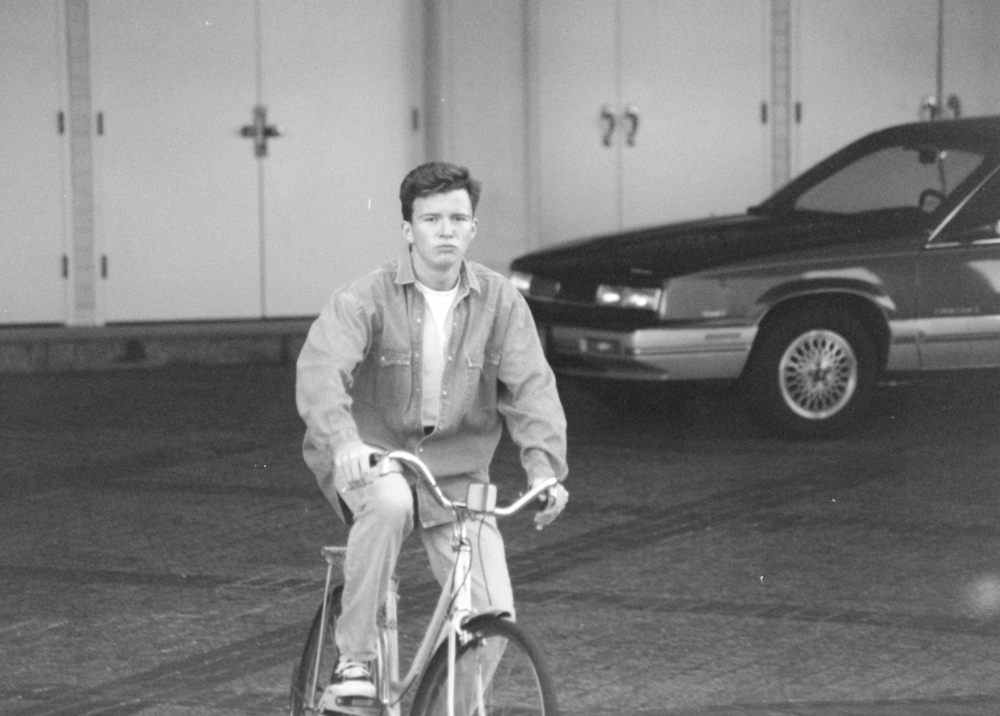

In [5]:
cv2_imshow(gray_img)

In [6]:
r_gray_min ,r_gray_max = calculate_gray_min_max(gray_img)
print("R_min of gray input is : ",r_gray_min)
print("R_max of gray output is : ",r_gray_max)

R_min of gray input is :  21
R_max of gray output is :  255


**l and m <1 && n>1**

In [7]:
new_img = contrast_stretching_gray(gray_img,40,200,0.6,1.2,0.8)

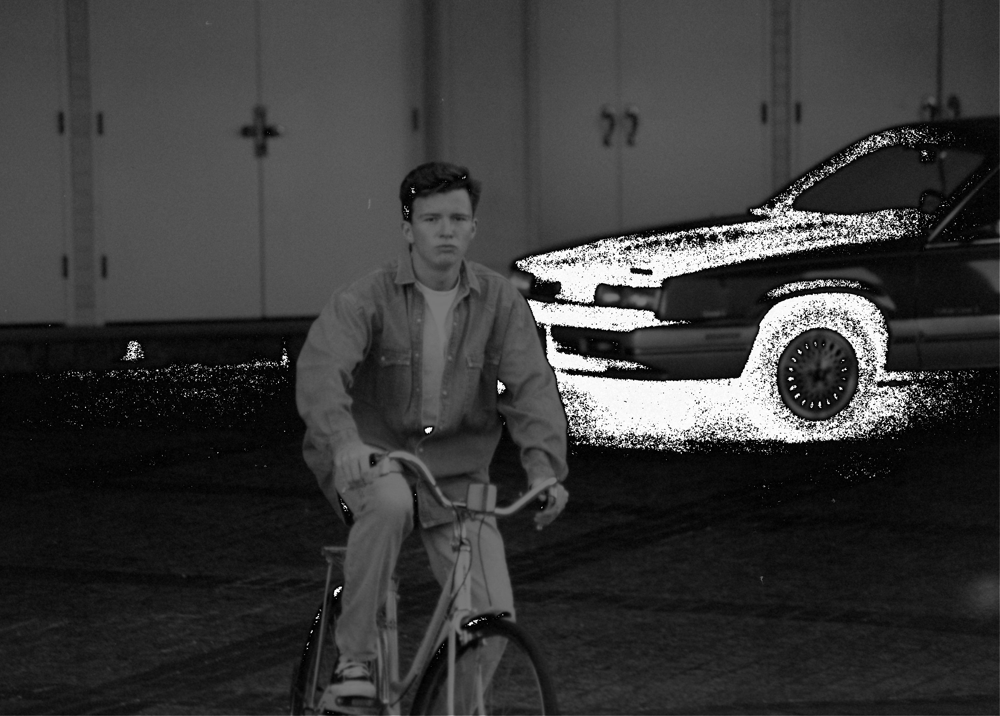

In [8]:
cv2_imshow(new_img)

In [9]:
r_gray_min ,r_gray_max = calculate_gray_min_max(new_img)
print("R_min of gray input is : ",r_gray_min)
print("R_max of gray output is : ",r_gray_max)

R_min of gray input is :  0
R_max of gray output is :  255


**l,n,m <1**

In [10]:
new_img = contrast_stretching_gray(gray_img,100,200,1.4,0.4,1.6)

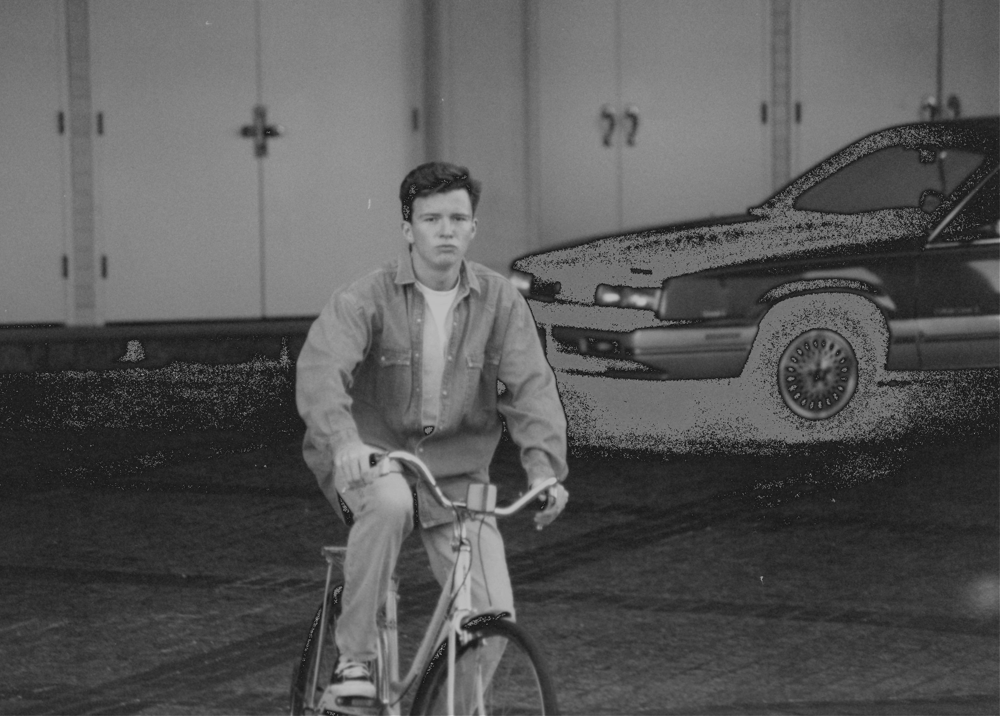

In [11]:
cv2_imshow(new_img)

In [12]:
r_gray_min ,r_gray_max = calculate_gray_min_max(new_img)
print("R_min of gray input is : ",r_gray_min)
print("R_max of gray output is : ",r_gray_max)

R_min of gray input is :  21
R_max of gray output is :  189


**Dynamic Range Compression**

In [39]:
gray_img = cv2.imread('/content/ipcv3_low_contrast.jpg',0)

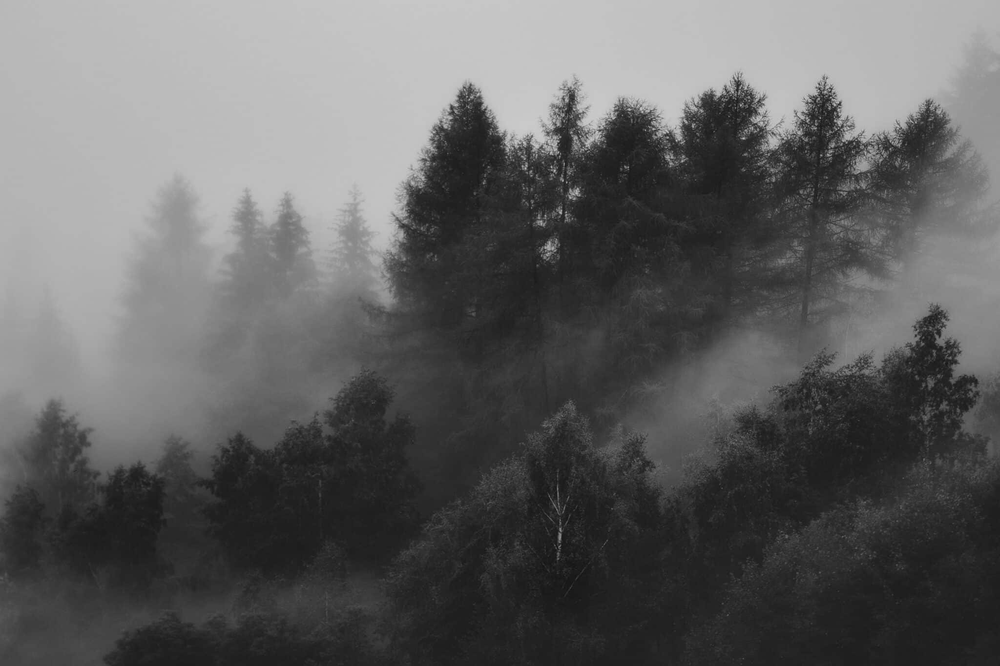

In [40]:
cv2_imshow(gray_img)

In [41]:
r_min,r_max = calculate_gray_min_max(gray_img)

In [42]:
print("r_min is : ",r_min)
print("r_max is : ",r_max)

r_min is :  8
r_max is :  216


In [43]:
import math

In [44]:
def Dynamic_Range_Compression(img,c):
  row,col = img.shape[0],img.shape[1]

  for i in range(row-1):
    for j in range(col-1):


      pixel = img[i,j]

      pixel = c*math.log(pixel + 1)

      img[i,j] = pixel

  return img

In [45]:
dyn_cmp_img = Dynamic_Range_Compression(gray_img,40)

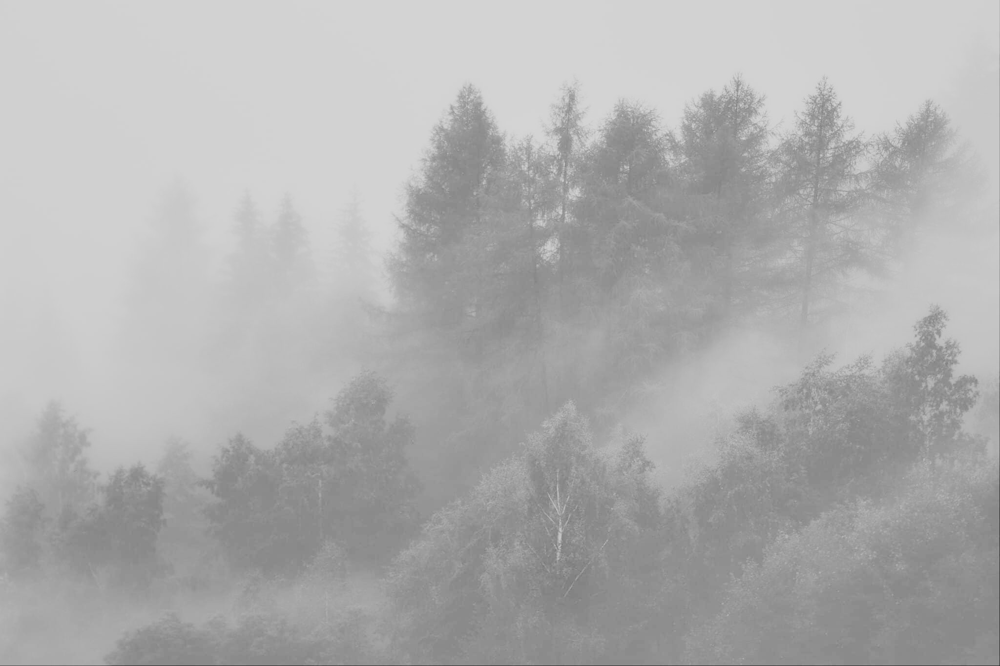

In [46]:
cv2_imshow(dyn_cmp_img)

In [47]:
r_min,r_max = calculate_gray_min_max(dyn_cmp_img)

In [48]:
print("r_min is : ",r_min)
print("r_max is : ",r_max)

r_min is :  87
r_max is :  215


**Power Law Transformation**

In [50]:
gray_img = cv2.imread('/content/ipcv3_low_contrast.jpg',0)

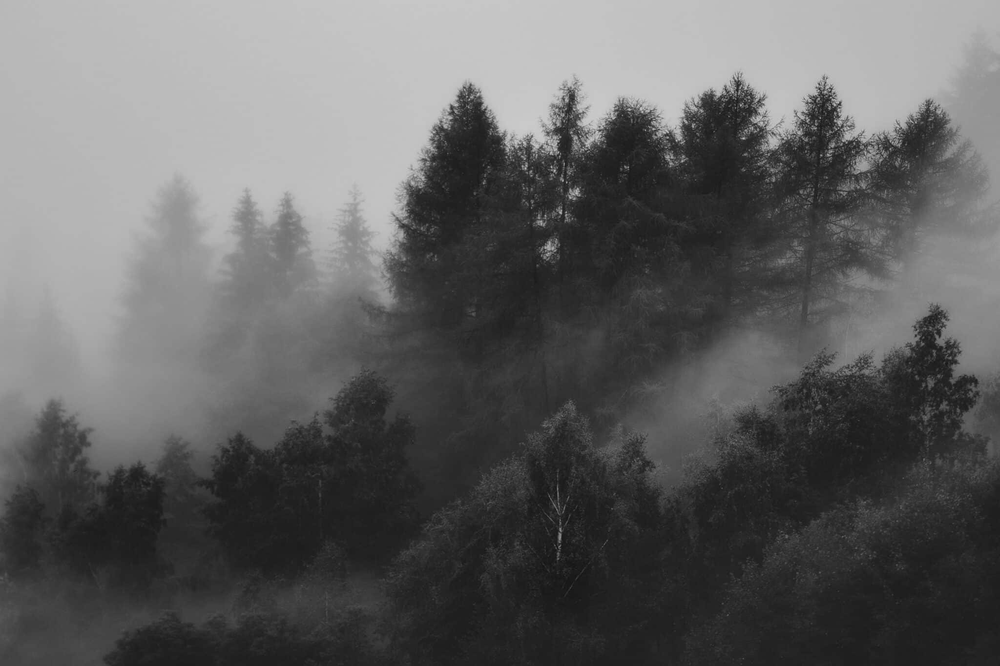

In [52]:
cv2_imshow(gray_img)

In [53]:
r_min,r_max = calculate_gray_min_max(gray_img)
print("r_min is : ",r_min)
print("r_max is : ",r_max)

r_min is :  8
r_max is :  216


In [54]:
def Power_Law_Transformation(img,gamma):
  row,col = img.shape[0],img.shape[1]

  for i in range(row-1):
    for j in range(col-1):


      pixel = img[i,j]

      pixel = pixel**gamma

      img[i,j] = pixel

  return img

**Gamma<1**

In [55]:
gamma1_img = Power_Law_Transformation(gray_img,0.6)

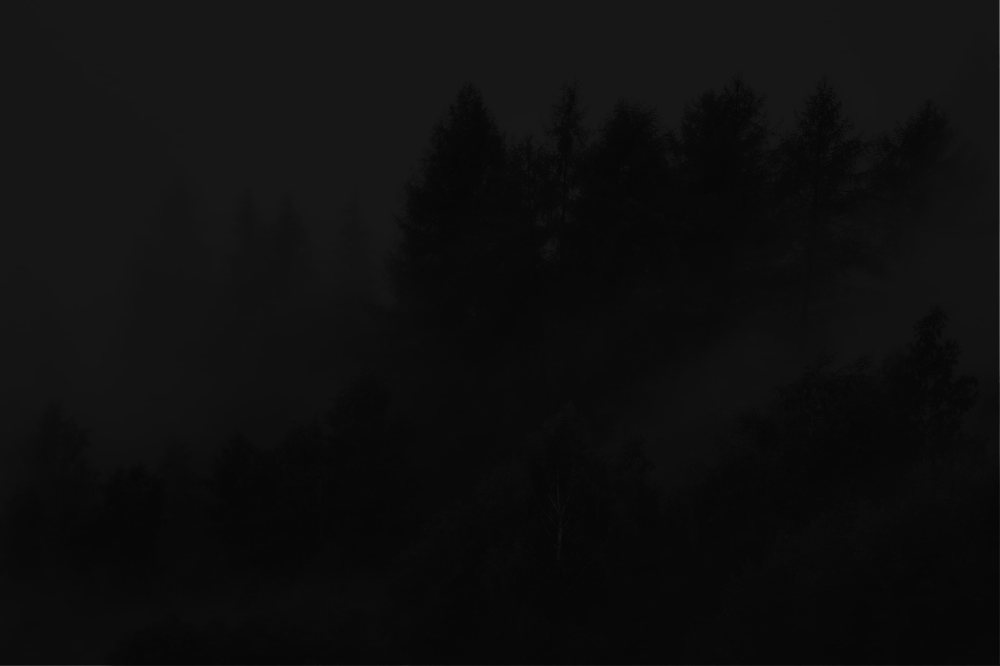

In [56]:
cv2_imshow(gamma1_img)

In [57]:
r_min,r_max = calculate_gray_min_max(gamma1_img)
print("r_min is : ",r_min)
print("r_max is : ",r_max)

r_min is :  3
r_max is :  25


**Gamma>1**

In [58]:
gamma2_img = Power_Law_Transformation(gray_img,1.2)

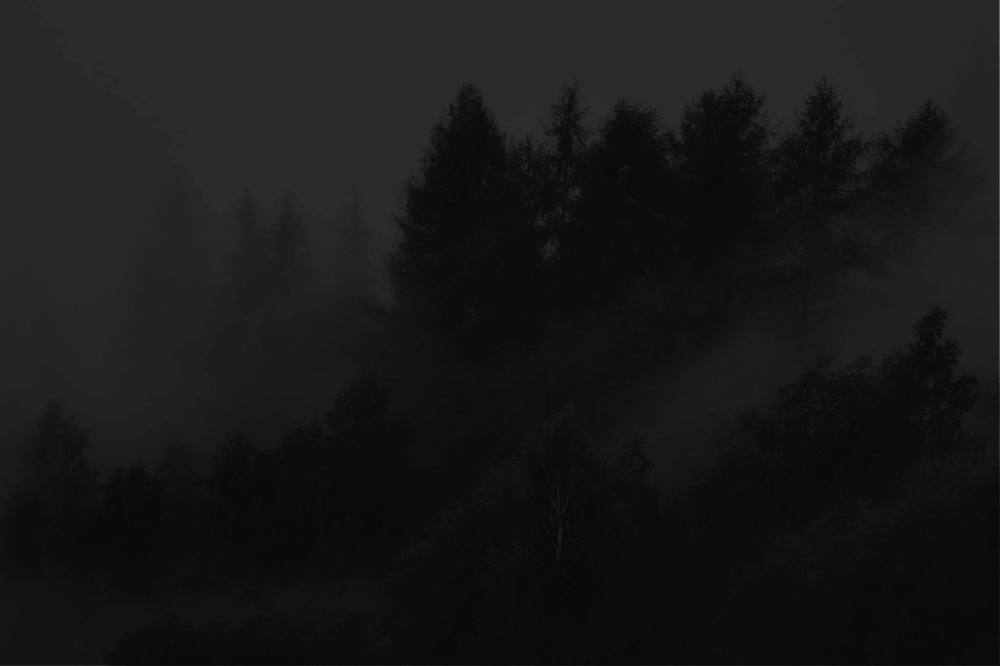

In [59]:
cv2_imshow(gamma2_img)

In [60]:
r_min,r_max = calculate_gray_min_max(gamma2_img)
print("r_min is : ",r_min)
print("r_max is : ",r_max)

r_min is :  3
r_max is :  47
